In [29]:
from os.path import basename
from dateutil import parser
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from rasters import Raster
from time_conversion import calculate_hour_of_day
from PTJPL import process_PTJPL_raster
from STIC import process_STIC_raster
%matplotlib inline

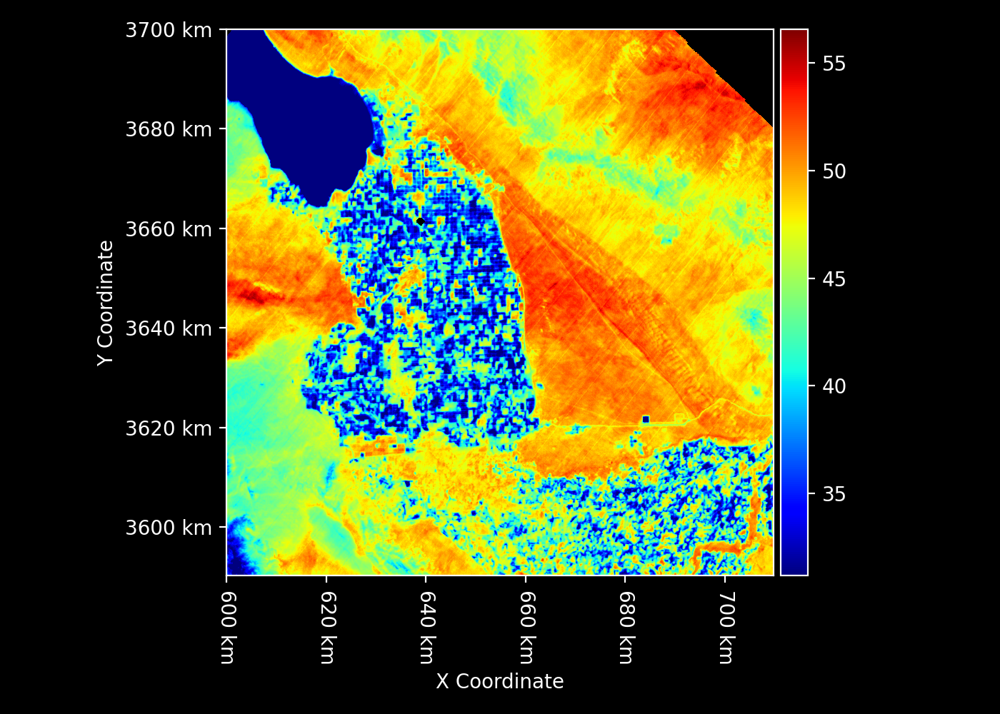

In [2]:
ST_C_filename = "example_ECOSTRESS_input/ECOv002_L2T_LSTE_21485_013_11SPS_20220420T211350_0601_01/ECOv002_L2T_LSTE_21485_013_11SPS_20220420T211350_0601_01_LST.tif"
ST_C = Raster.open(ST_C_filename) - 273.15
ST_C

In [3]:
geometry = ST_C.geometry
geometry

{
  "dimensions": {
    "rows": 1568,
    "cols": 1568
  },
  "bbox": {
    "xmin": 600000.0,
    "ymin": 3590260.0,
    "xmax": 709760.0,
    "ymax": 3700020.0
  },
  "crs": "EPSG:32611",
  "resolution": {
    "cell_width": 70.0,
    "cell_height": -70.0
  }
}

In [4]:
time_UTC = parser.parse(basename(ST_C_filename).split("_")[6])
time_UTC

datetime.datetime(2022, 4, 20, 21, 13, 50)

/Users/gregoryhalverson/Projects/ET-Sensitivity/raster/raster.py:4356: MatplotlibDeprecationWarning: Auto-close()ing of figures upon backend switching is deprecated since 3.8 and will be removed two minor releases later.  To suppress this warning, explicitly call plt.close('all') first.
  plt.switch_backend(prior_backend)


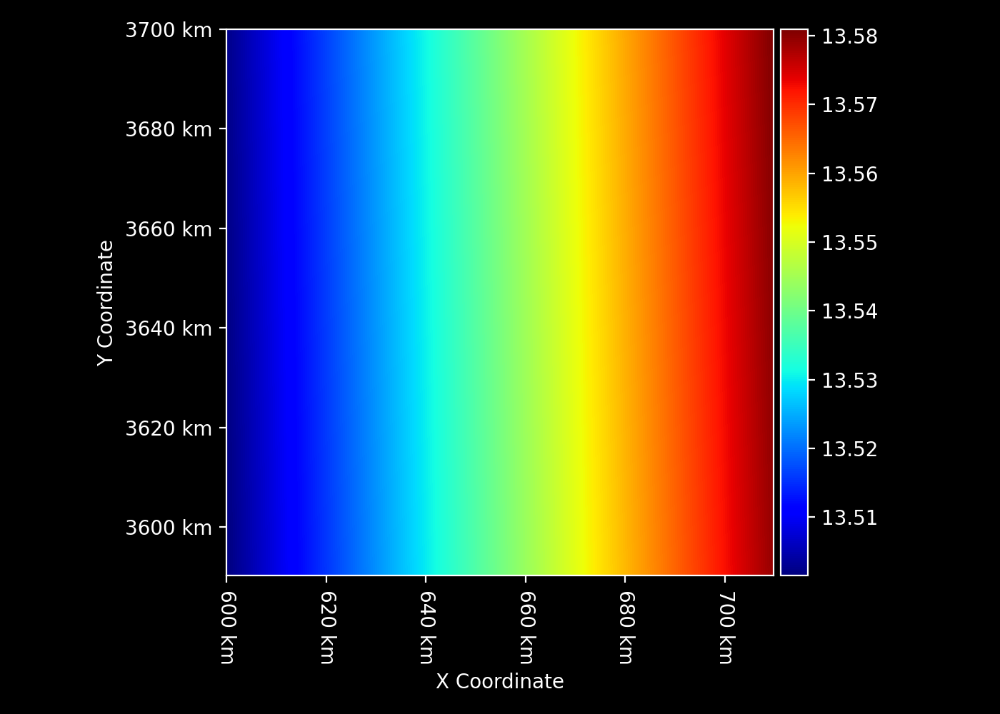

In [5]:
hour_of_day = calculate_hour_of_day(time_UTC, geometry=geometry)
hour_of_day

/Users/gregoryhalverson/Projects/ET-Sensitivity/raster/raster.py:4356: MatplotlibDeprecationWarning: Auto-close()ing of figures upon backend switching is deprecated since 3.8 and will be removed two minor releases later.  To suppress this warning, explicitly call plt.close('all') first.
  plt.switch_backend(prior_backend)


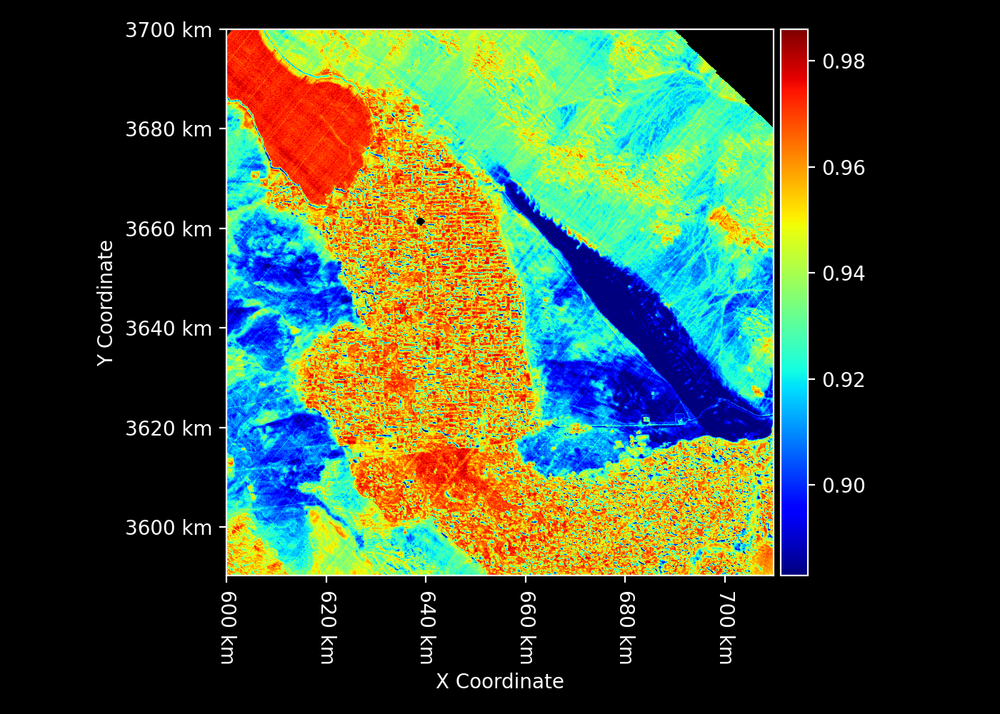

In [6]:
emissivity_filename = "example_ECOSTRESS_input/ECOv002_L2T_LSTE_21485_013_11SPS_20220420T211350_0601_01/ECOv002_L2T_LSTE_21485_013_11SPS_20220420T211350_0601_01_EmisWB.tif"
emissivity = Raster.open(emissivity_filename)
emissivity

/Users/gregoryhalverson/Projects/ET-Sensitivity/raster/raster.py:4356: MatplotlibDeprecationWarning: Auto-close()ing of figures upon backend switching is deprecated since 3.8 and will be removed two minor releases later.  To suppress this warning, explicitly call plt.close('all') first.
  plt.switch_backend(prior_backend)


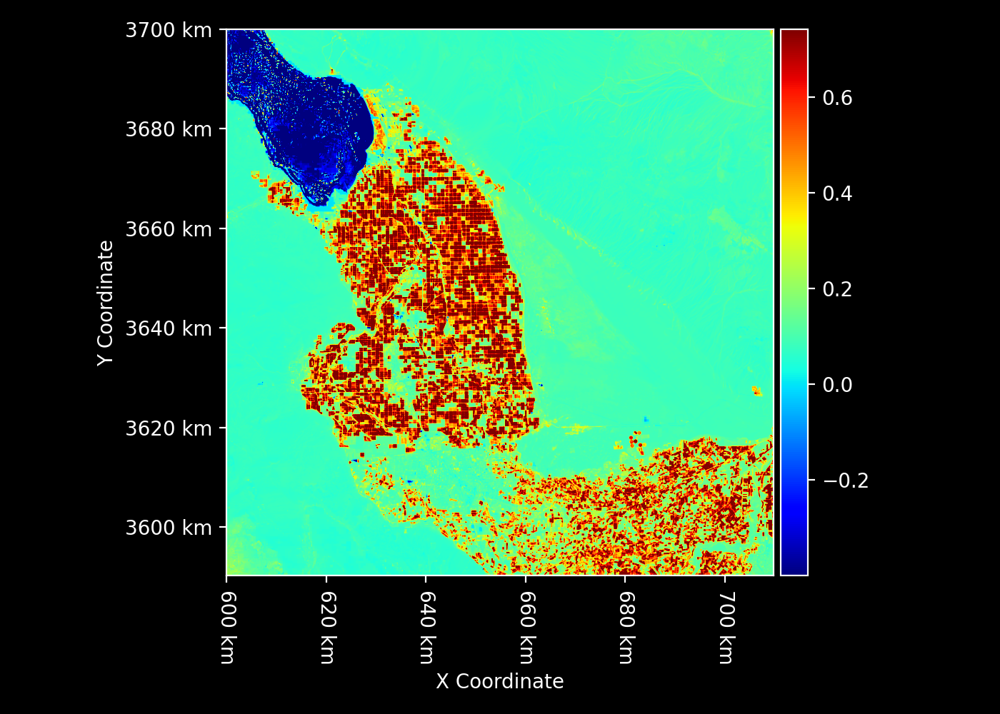

In [7]:
NDVI_filename = "example_ECOSTRESS_input/ECOv002_L2T_STARS_21485_013_11SPS_20220420_0700_01/ECOv002_L2T_STARS_21485_013_11SPS_20220420_0700_01_NDVI.tif"
NDVI = Raster.open(NDVI_filename)
NDVI

/Users/gregoryhalverson/Projects/ET-Sensitivity/raster/raster.py:4356: MatplotlibDeprecationWarning: Auto-close()ing of figures upon backend switching is deprecated since 3.8 and will be removed two minor releases later.  To suppress this warning, explicitly call plt.close('all') first.
  plt.switch_backend(prior_backend)


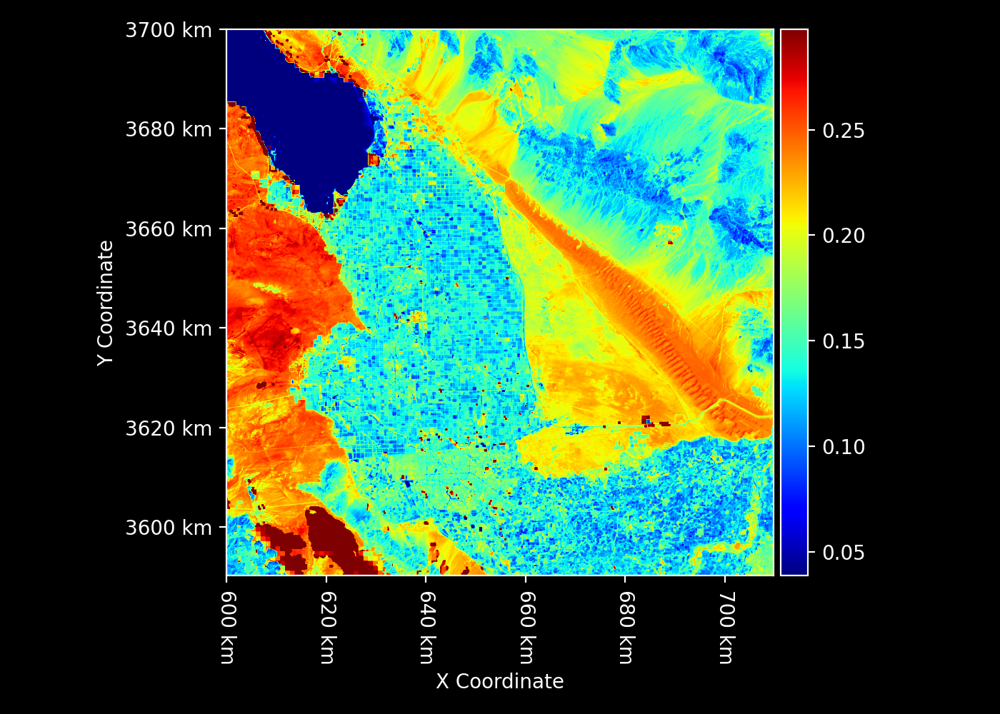

In [8]:
albedo_filename = "example_ECOSTRESS_input/ECOv002_L2T_STARS_21485_013_11SPS_20220420_0700_01/ECOv002_L2T_STARS_21485_013_11SPS_20220420_0700_01_albedo.tif"
albedo = Raster.open(albedo_filename)
albedo

/Users/gregoryhalverson/Projects/ET-Sensitivity/raster/raster.py:4356: MatplotlibDeprecationWarning: Auto-close()ing of figures upon backend switching is deprecated since 3.8 and will be removed two minor releases later.  To suppress this warning, explicitly call plt.close('all') first.
  plt.switch_backend(prior_backend)


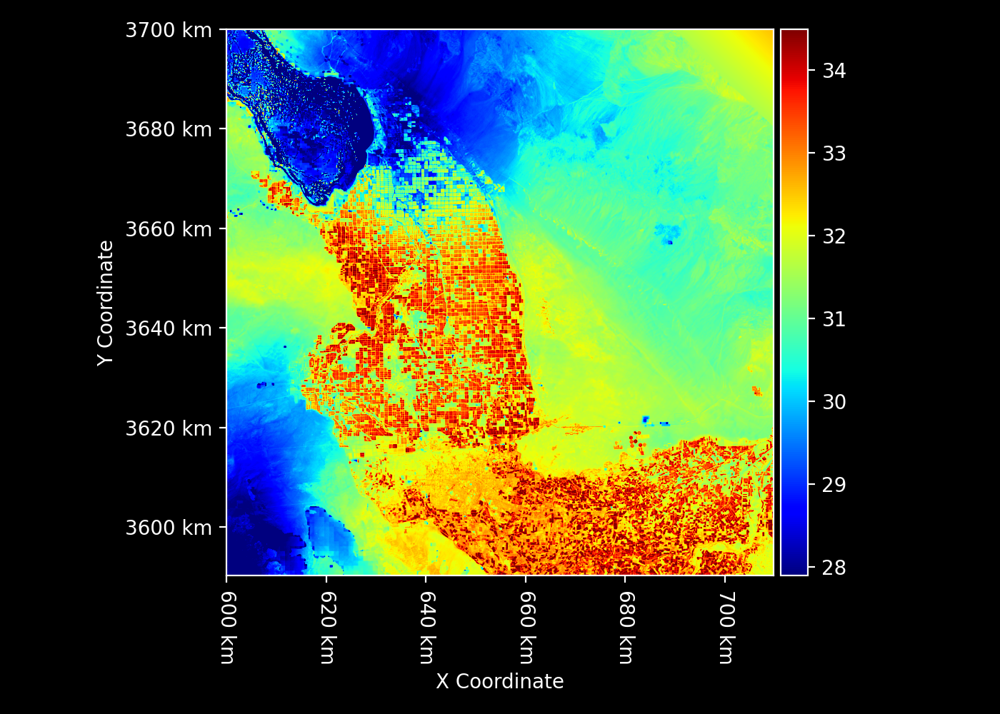

In [9]:
Ta_C_filename = "example_ECOSTRESS_input/ECOv002_L3T_MET_21485_013_11SPS_20220420T211350_0700_01/ECOv002_L3T_MET_21485_013_11SPS_20220420T211350_0700_01_Ta.tif"
Ta_C = Raster.open(Ta_C_filename)
Ta_C

/Users/gregoryhalverson/Projects/ET-Sensitivity/raster/raster.py:4356: MatplotlibDeprecationWarning: Auto-close()ing of figures upon backend switching is deprecated since 3.8 and will be removed two minor releases later.  To suppress this warning, explicitly call plt.close('all') first.
  plt.switch_backend(prior_backend)


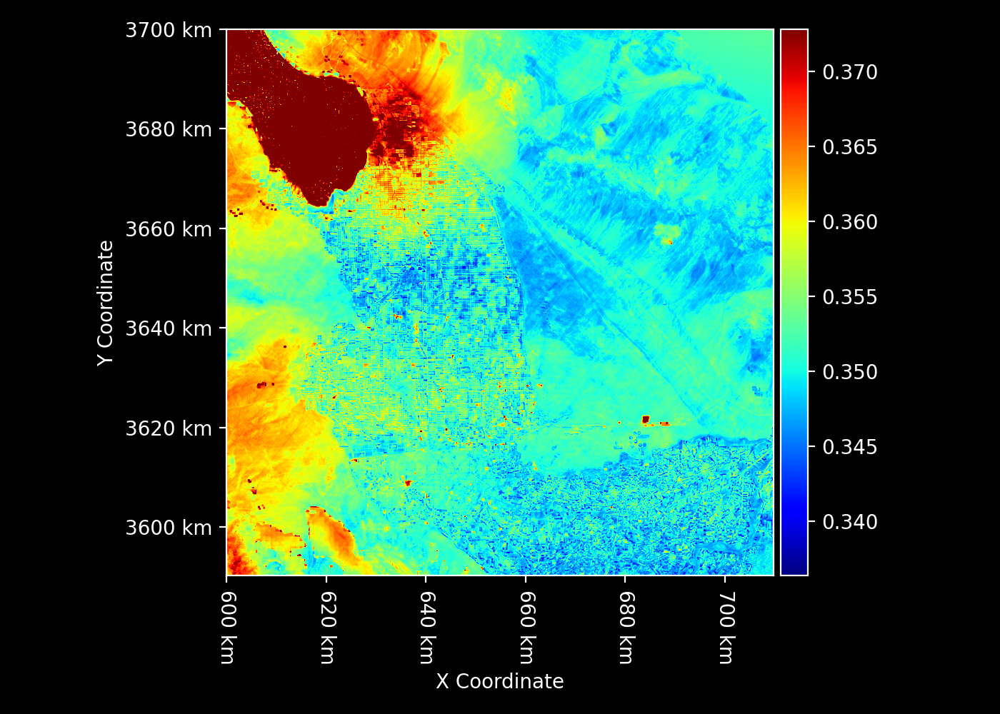

In [10]:
RH_filename = "example_ECOSTRESS_input/ECOv002_L3T_MET_21485_013_11SPS_20220420T211350_0700_01/ECOv002_L3T_MET_21485_013_11SPS_20220420T211350_0700_01_RH.tif"
RH = Raster.open(RH_filename)
RH

/Users/gregoryhalverson/Projects/ET-Sensitivity/raster/raster.py:4356: MatplotlibDeprecationWarning: Auto-close()ing of figures upon backend switching is deprecated since 3.8 and will be removed two minor releases later.  To suppress this warning, explicitly call plt.close('all') first.
  plt.switch_backend(prior_backend)


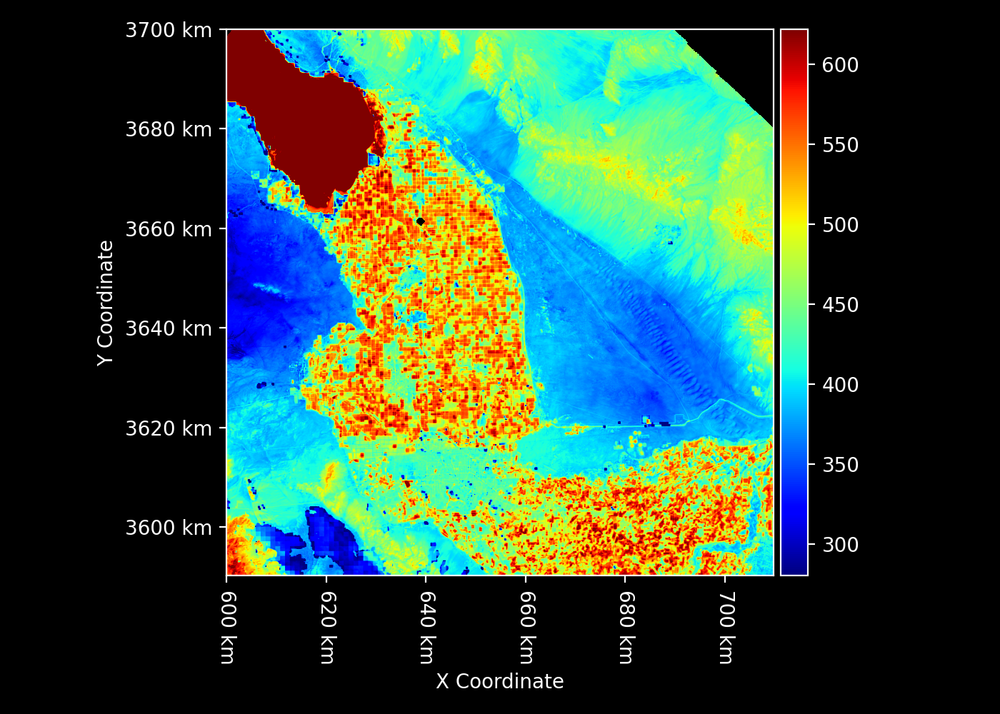

In [11]:
Rn_filename = "example_ECOSTRESS_input/ECOv002_L3T_SEB_21485_013_11SPS_20220420T211350_0700_01/ECOv002_L3T_SEB_21485_013_11SPS_20220420T211350_0700_01_Rn.tif"
Rn = Raster.open(Rn_filename)
Rn

/Users/gregoryhalverson/Projects/ET-Sensitivity/raster/raster.py:4356: MatplotlibDeprecationWarning: Auto-close()ing of figures upon backend switching is deprecated since 3.8 and will be removed two minor releases later.  To suppress this warning, explicitly call plt.close('all') first.
  plt.switch_backend(prior_backend)


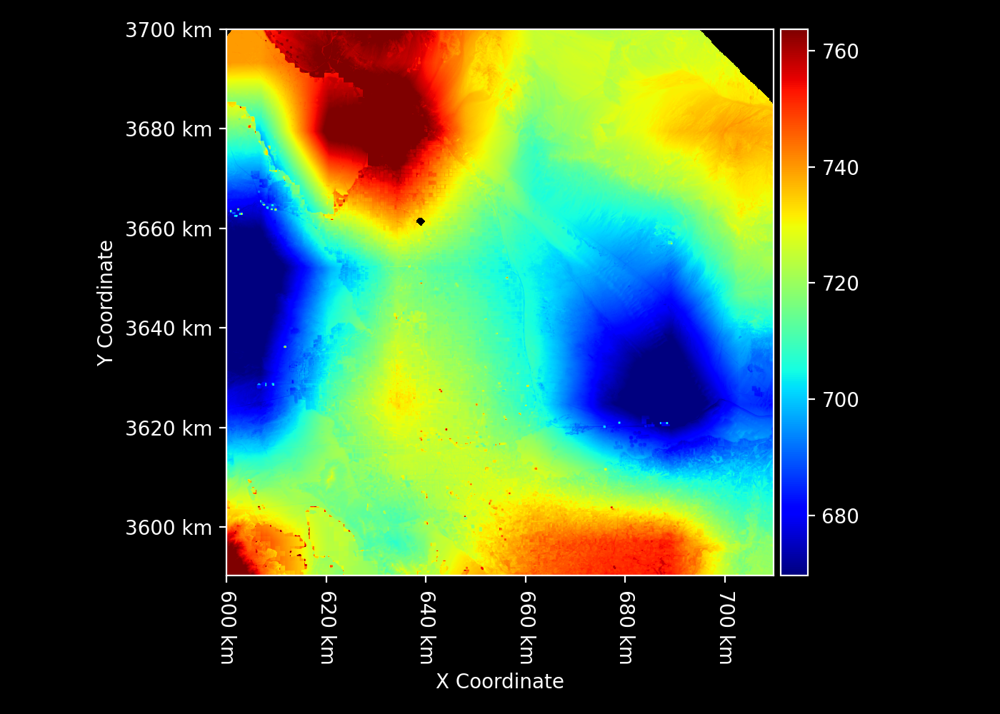

In [12]:
Rg_filename = "example_ECOSTRESS_input/ECOv002_L3T_SEB_21485_013_11SPS_20220420T211350_0700_01/ECOv002_L3T_SEB_21485_013_11SPS_20220420T211350_0700_01_Rg.tif"
Rg = Raster.open(Rg_filename)
Rg

In [13]:
PTJPL_results = process_PTJPL_raster(
    geometry=geometry,
    ST_C=ST_C,
    emissivity=emissivity,
    NDVI=NDVI,
    albedo=albedo,
    Ta_C=Ta_C,
    RH=RH,
    Rn=Rn
)

PTJPL_results

{'Rn_soil': <raster.raster.Raster at 0x2b19c64f0>,
 'G': <raster.raster.Raster at 0x2a9ab7880>,
 'LE_soil': <raster.raster.Raster at 0x2addc9640>,
 'Rn_canopy': <raster.raster.Raster at 0x2b19cbbe0>,
 'PET': <raster.raster.Raster at 0x2b19d1670>,
 'LE_canopy': <raster.raster.Raster at 0x2af17d700>,
 'LE_interception': <raster.raster.Raster at 0x2b1990d00>,
 'LE': <raster.raster.Raster at 0x2b1990c10>}

/Users/gregoryhalverson/Projects/ET-Sensitivity/raster/raster.py:4356: MatplotlibDeprecationWarning: Auto-close()ing of figures upon backend switching is deprecated since 3.8 and will be removed two minor releases later.  To suppress this warning, explicitly call plt.close('all') first.
  plt.switch_backend(prior_backend)


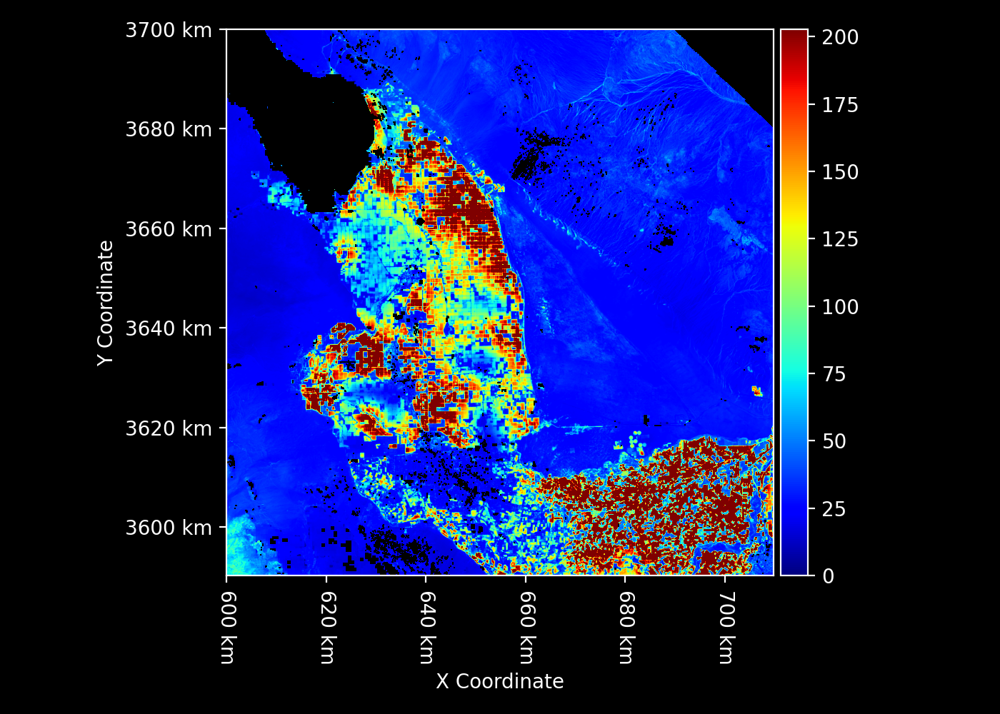

In [19]:
LE_PTJPL = PTJPL_results["LE"]
LE_PTJPL

In [15]:
STIC_results = process_STIC_raster(
    geometry=geometry,
    hour_of_day=hour_of_day,
    ST_C=ST_C,
    emissivity=emissivity,
    NDVI=NDVI,
    albedo=albedo,
    Ta_C=Ta_C,
    RH=RH,
    Rn=Rn,
    Rg=Rg
)

STIC_results

/Users/gregoryhalverson/Projects/ET-Sensitivity/STIC/initialize_with_solar.py:34: RuntimeWarning: divide by zero encountered in log
  lai = -np.log(1 - fc) / 0.5


[2024-01-05 15:52:05 INFO] running STIC iteration 3 / 3
[2024-01-05 15:52:06 INFO] completed STIC iteration 3 / 3 with max LE change: 11.924115958412642 (0.32 seconds)
cannot reshape array of size 1 into shape (1568,1568)
'int' object has no attribute 'reshape'


{'LE_max_change': 11.924115958412642,
 'iteration': 3,
 'LE': <raster.raster.Raster at 0x2b197efd0>,
 'LE_change': <raster.raster.Raster at 0x2a9adc0d0>,
 'LEt': <raster.raster.Raster at 0x2b19f1d60>,
 'PT': <raster.raster.Raster at 0x2b19f1e80>,
 'PET': <raster.raster.Raster at 0x2b19f1eb0>,
 'G': <raster.raster.Raster at 0x2b19f1c40>}

/Users/gregoryhalverson/Projects/ET-Sensitivity/raster/raster.py:4356: MatplotlibDeprecationWarning: Auto-close()ing of figures upon backend switching is deprecated since 3.8 and will be removed two minor releases later.  To suppress this warning, explicitly call plt.close('all') first.
  plt.switch_backend(prior_backend)


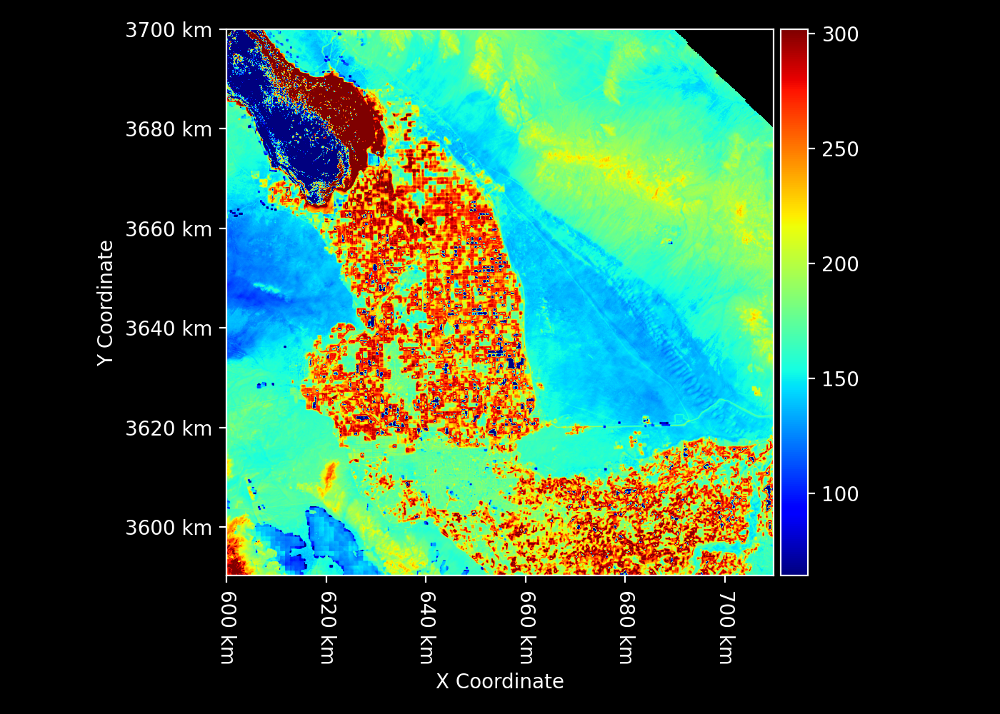

In [18]:
LE_STIC = STIC_results["LE"]
LE_STIC

/Users/gregoryhalverson/Projects/ET-Sensitivity/raster/raster.py:4356: MatplotlibDeprecationWarning: Auto-close()ing of figures upon backend switching is deprecated since 3.8 and will be removed two minor releases later.  To suppress this warning, explicitly call plt.close('all') first.
  plt.switch_backend(prior_backend)


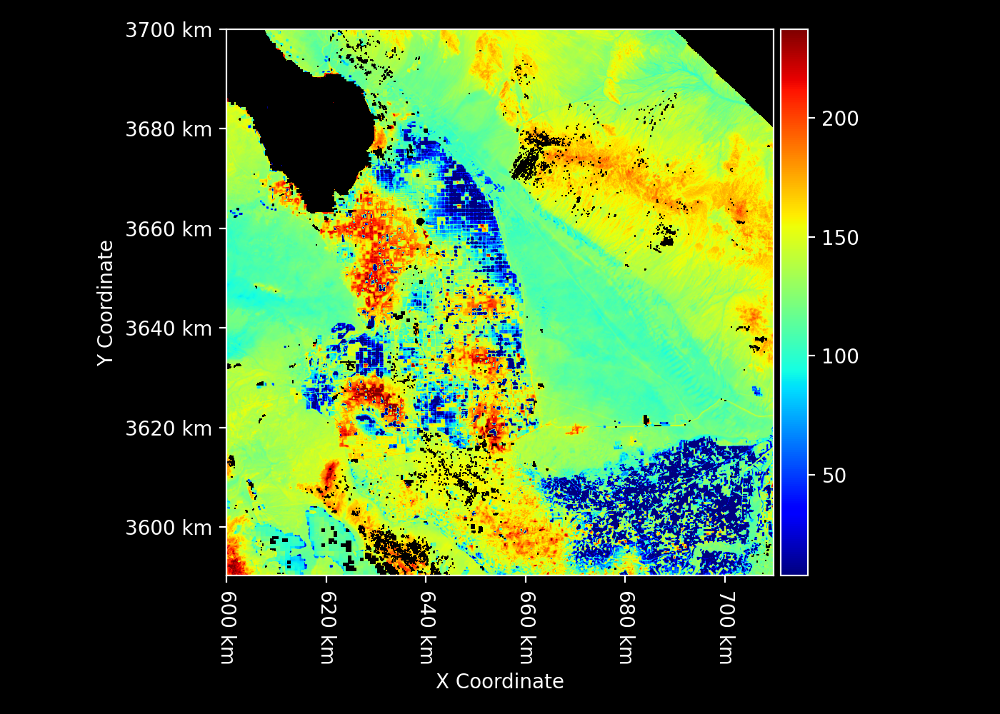

In [20]:
LE_STIC - LE_PTJPL

In [35]:
df = pd.DataFrame({
    "PTJPL": LE_PTJPL.flatten(),
    "STIC": LE_STIC.flatten(),
    "ST": ST_C.flatten()
})

df = df.dropna()
df = df[df.PTJPL > 10]
df = df[df.STIC > 10]

df

,PTJPL,STIC,ST
107,23.239489,123.892994,45.790009
108,21.226987,126.738585,47.429993
109,21.182482,126.797170,48.089996
110,22.843064,140.417226,48.369995
111,22.959314,137.968348,49.309998
...,...,...,...
2458619,27.572473,154.336177,48.670013
2458620,20.069753,147.798223,50.070007
2458621,25.434028,154.121408,47.850006
2458622,32.439570,156.066275,48.429993


<Axes: xlabel='PTJPL', ylabel='STIC'>

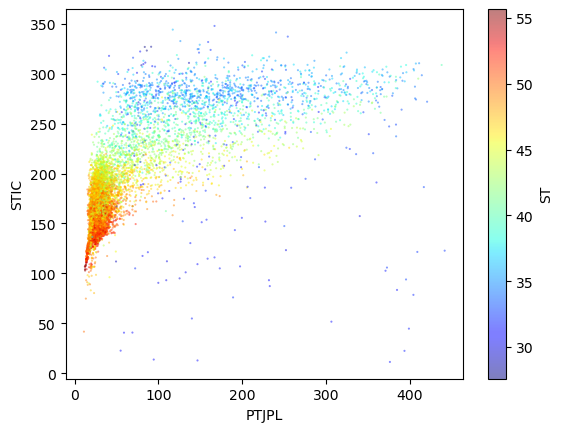

In [47]:
df.sample(n=10000).plot.scatter(x="PTJPL", y="STIC", c="ST", alpha=0.5, cmap="jet", marker=".", s=1)